# CA2 Data Preparation and Machine Learning

Report by:  <font color=blue> Leandro Marigo
   
Lecturers: <font color=blue> David McQuaid (Data Prep) / Dr. Muhammad Iqbal (Machine Learning)
    
Date: <font color=blue> January 2023

## Licence

CC0 1.0 Universal (CC0 1.0)
Public Domain Dedication

The person who associated a work with this deed has dedicated the work to the public domain by waiving all of his or her rights to the work worldwide under copyright law, including all related and neighboring rights, to the extent allowed by law.

You can copy, modify, distribute and perform the work, even for commercial purposes, all without asking permission.

## About the dataset  

Online retailer, eBay is providing an option of bidding to their customers globally. Bidding is employed to
find the real price of items in the market based on the demand. The price offered by anyone participating in
this process is termed as a 'bid'. A dataset is available at the following link and on Moodle for the bidding of
customers  

https://archive.ics.uci.edu/ml/datasets/Shill+Bidding+Dataset  

Normal bids are classified as ‘0’ bids in the data set and anomalous bids as ‘1’. Your goal is to use
classification or clustering algorithms to predict the bids in the future. You would need to clean and prepare
the dataset for the machine learning modelling under the guidelines for Data Preparation and
Machine Learning modules provided in the CA2 document.

## Atribute information:

**Record ID:** Unique identifier of a record in the dataset.  
**Auction ID:** Unique identifier of an auction.  
**Bidder ID:** Unique identifier of a bidder.  
**Bidder Tendency:** A shill bidder participates exclusively in auctions of few sellers rather than a diversified lot. This is a collusive act involving the fraudulent seller and an accomplice.  
**Bidding Ratio:** A shill bidder participates more frequently to raise the auction price and attract higher bids from legitimate participants.  
**Successive Outbidding:** A shill bidder successively outbids himself even though he is the current winner to increase the price gradually with small consecutive increments.  
**Last Bidding:** A shill bidder becomes inactive at the last stage of the auction (more than 90\% of the auction duration) to avoid winning the auction.  
**Auction Bids:** Auctions with SB activities tend to have a much higher number of bids than the average of bids in concurrent auctions.  
**Auction Starting Price:** a shill bidder usually offers a small starting price to attract legitimate bidders into the auction.  
**Early Bidding:** A shill bidder tends to bid pretty early in the auction (less than 25\% of the auction duration) to get the attention of auction users.  
**Winning Ratio:** A shill bidder competes in many auctions but hardly wins any auctions.
Auction Duration: How long an auction lasted.  
**Class:** 0 for normal behaviour bidding; 1 for otherwise.  

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      Introduction
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

The report contains and outline data analysis details and machine learning implementation to the "Shill Bidding Dataset".  

**The main goals are:**  
    - Format and prepare the data for machine learning;  
    - Explore the possibility of using dimensional reduction on the dataset, and explain the differences between the employed techniques;  
    - Achieve high levels of accuracy for classification/prediction of anomalous bidding behaviour and explain the choice of machine learning models;  
    - Apply hyperparameters tunning and compare metrics;  
    
**The report is structured in different sections as outlined below:**  
    1. Exploratory Data Analysis  
    2. Further EDA - Visualizations and Data Cleaning  
    3. Scaling / Normalizing the Data  
    4. Feature Importance / Selection  
    5. First Round passing through the ML models  
    6. Balancing the target variable - feature 'Class'  
    7. Second Round passing through the ML models  
    8. Applying PCA (Principal Component Analysis)  
    9. Applying LDA (Linear Discriminant Analysis)  
    10. Dimensionality Reduction - Differences between PCA and LDA - Explained  
    11. Models Hyperparameter tuning  
    12. Findings and Conclusions  
    13. Bibliography  

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      1. Exploratory Data Analysis
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

In [1]:
from IPython.display import HTML
HTML('''<script>
code_show=true;
function code_toggle() {
if (code_show){
$('div.input').hide();
}else{
$('div.input').show();
}
code_show = !code_show
}
$(document).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore') 

In [3]:
df = pd.read_csv("Shill Bidding Dataset.csv")

**Displaying the first 15 rows of the dataset to get an idea of how the data is formatted and distributed.**

In [4]:
df.head(15)

,Record_ID,Auction_ID,Bidder_ID,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Last_Bidding,Auction_Bids,Starting_Price_Average,Early_Bidding,Winning_Ratio,Auction_Duration,Class
0,1,732,_***i,0.200000,0.400000,0.0,0.000028,0.000000,0.993593,0.000028,0.666667,5,0
1,2,732,g***r,0.024390,0.200000,0.0,0.013123,0.000000,0.993593,0.013123,0.944444,5,0
2,3,732,t***p,0.142857,0.200000,0.0,0.003042,0.000000,0.993593,0.003042,1.000000,5,0
3,4,732,7***n,0.100000,0.200000,0.0,0.097477,0.000000,0.993593,0.097477,1.000000,5,0
4,5,900,z***z,0.051282,0.222222,0.0,0.001318,0.000000,0.000000,0.001242,0.500000,7,0
5,8,900,i***e,0.038462,0.111111,0.0,0.016844,0.000000,0.000000,0.016844,0.800000,7,0
6,10,900,m***p,0.400000,0.222222,0.0,0.006781,0.000000,0.000000,0.006774,0.750000,7,0
7,12,900,k***a,0.137931,0.444444,1.0,0.768044,0.000000,0.000000,0.016311,1.000000,7,1
8,13,2370,g***r,0.121951,0.185185,1.0,0.035021,0.333333,0.993528,0.023963,0.944444,7,1
9,27,600,e***t,0.155172,0.346154,0.5,0.570994,0.307692,0.993593,0.413788,0.611111,7,1


In [5]:
df.shape

(6321, 13)

**The dataset contains 13 features across 6321 rows of data**

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6321 entries, 0 to 6320
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Record_ID               6321 non-null   int64  
 1   Auction_ID              6321 non-null   int64  
 2   Bidder_ID               6321 non-null   object 
 3   Bidder_Tendency         6321 non-null   float64
 4   Bidding_Ratio           6321 non-null   float64
 5   Successive_Outbidding   6321 non-null   float64
 6   Last_Bidding            6321 non-null   float64
 7   Auction_Bids            6321 non-null   float64
 8   Starting_Price_Average  6321 non-null   float64
 9   Early_Bidding           6321 non-null   float64
 10  Winning_Ratio           6321 non-null   float64
 11  Auction_Duration        6321 non-null   int64  
 12  Class                   6321 non-null   int64  
dtypes: float64(8), int64(4), object(1)
memory usage: 642.1+ KB


**All features are float or integer with the exception of "Bidder_ID" which is a unique identifier of a bidder.**

In [7]:
df.describe()

,Record_ID,Auction_ID,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Last_Bidding,Auction_Bids,Starting_Price_Average,Early_Bidding,Winning_Ratio,Auction_Duration,Class
count,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000
mean,7535.829457,1241.388230,0.142541,0.127670,0.103781,0.463119,0.231606,0.472821,0.430683,0.367731,4.615093,0.106787
std,4364.759137,735.770789,0.197084,0.131530,0.279698,0.380097,0.255252,0.489912,0.380785,0.436573,2.466629,0.308867
min,1.000000,5.000000,0.000000,0.011765,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,3778.000000,589.000000,0.027027,0.043478,0.000000,0.047928,0.000000,0.000000,0.026620,0.000000,3.000000,0.000000
50%,7591.000000,1246.000000,0.062500,0.083333,0.000000,0.440937,0.142857,0.000000,0.360104,0.000000,5.000000,0.000000
75%,11277.000000,1867.000000,0.166667,0.166667,0.000000,0.860363,0.454545,0.993593,0.826761,0.851852,7.000000,0.000000
max,15144.000000,2538.000000,1.000000,1.000000,1.000000,0.999900,0.788235,0.999935,0.999900,1.000000,10.000000,1.000000


In [8]:
df.describe(include=object)

,Bidder_ID
count,6321
unique,1054
top,a***a
freq,112


In [9]:
pip install dataprep

Note: you may need to restart the kernel to use updated packages.


**Plotting the dataprep EDA for visualization and features stats insights.**

  0%|          | 0/697 [00:00<?, ?it/s]


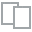
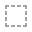
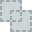
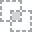
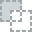
...
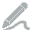
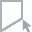
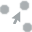
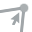
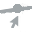

In [10]:
from dataprep.eda import plot, plot_correlation, create_report, plot_missing
plot(df)

In [11]:
df.isnull().sum()

Record_ID                 0
Auction_ID                0
Bidder_ID                 0
Bidder_Tendency           0
Bidding_Ratio             0
Successive_Outbidding     0
Last_Bidding              0
Auction_Bids              0
Starting_Price_Average    0
Early_Bidding             0
Winning_Ratio             0
Auction_Duration          0
Class                     0
dtype: int64

**There is no missing data in the original dataset.**

In [12]:
df.duplicated().sum()

0

**There are no duplicated rows in the original dataset.**

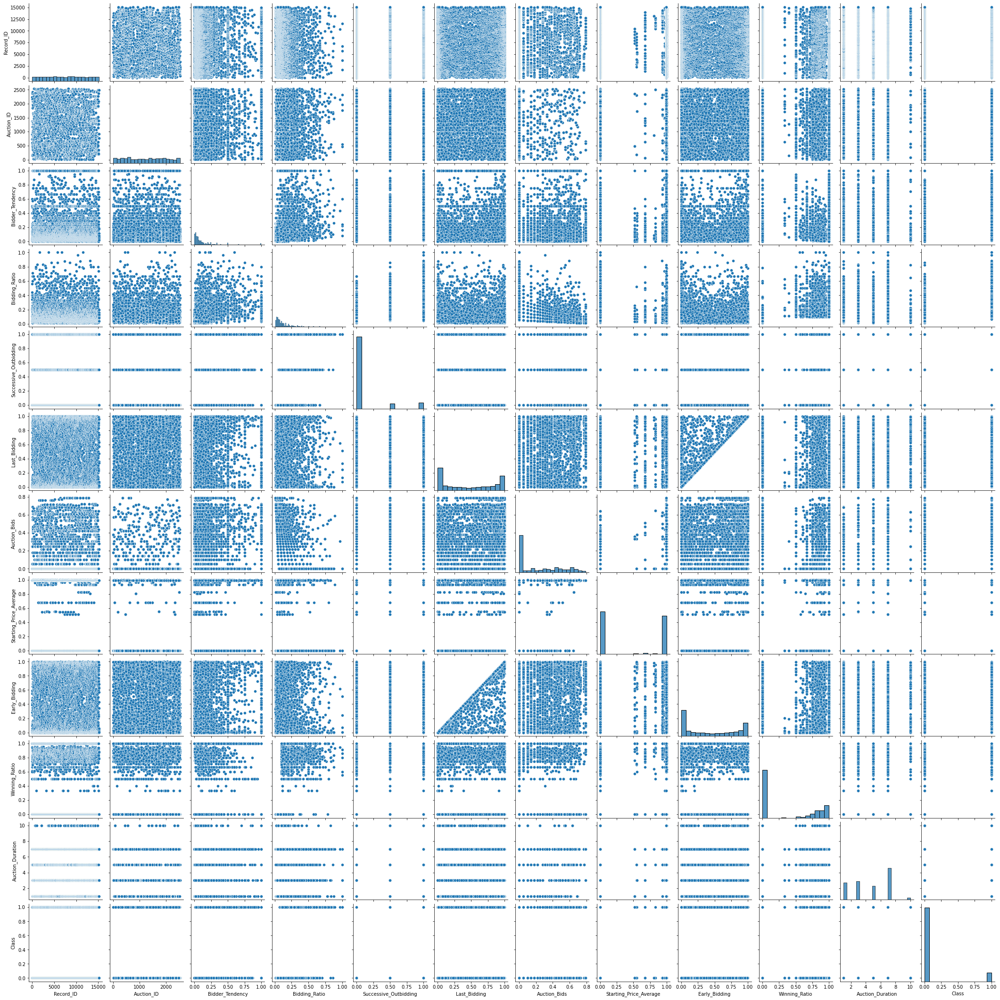

In [13]:
sns.pairplot(df)

<AxesSubplot:>

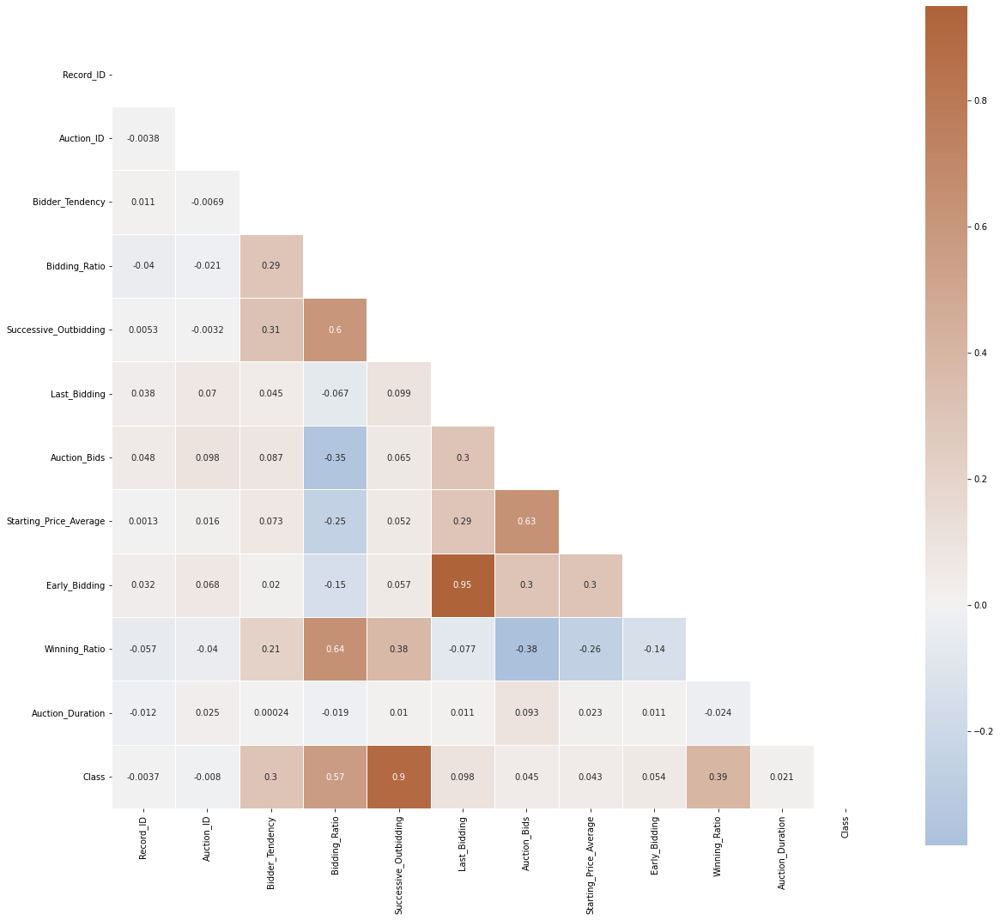

In [14]:
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(20, 20))
cmap = sns.diverging_palette(250, 30, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=True, linewidths=.5, cbar_kws={"shrink": .9})

### Heatmap and Pairplot Insights:  

    - Strong correlation between 'Early_Bidding' and 'Last_Bidding';  
    - Strong " between 'Class' and 'Successive_Outbidding';  
    - Medium correlation between 'Winning_Ratio' and 'Bidding_Ratio';  
    - Medium " between 'Starting_Price_Average' and 'Auction_Bids';  
    - Medium " between 'Successive_Outbidding' and 'Bidding_Ratio';  
    - Medium " between 'Class' and 'Bidding_Ratio';  
    

**I will check in more detail the columns ID (unique identifiers) to see if they will impact or be useful in our DataPrep or ML models or if these columns can be dropped:**

**Record ID** - this is the identifier of a record in the dataset and values are unique across all rows. Additionally, this feature does not have a strong/medium correlation with any other feature and therefore won't be valuable information for my model.

In [15]:
df.Record_ID.value_counts()

1        1
10015    1
10013    1
10011    1
10009    1
        ..
5032     1
5031     1
5026     1
5024     1
15144    1
Name: Record_ID, Length: 6321, dtype: int64

**Bidder ID** - this is the unique identifier of a Bidder, the data is hidden for confidentiality purposes, there should be a correlation between a bidder and anomalous or normal bidding behaviour and therefore the column is usefull to identify a fraudulent bidder that has already been registered in the database. However it's irrelevant for predditing if a bidding will or will not be fraudulent and therefore the feature won't be valuable information for my model.

In [16]:
df.Bidder_ID.value_counts()

a***a    112
n***t     85
e***e     67
i***a     50
r***r     49
        ... 
n***y      1
u***z      1
t***9      1
z***b      1
9***7      1
Name: Bidder_ID, Length: 1054, dtype: int64

**Auction ID** - this is the unique identifier of an auction, this feature does not have correlation with other features and no correlation with my target variable and therefore this won't be useful for predicting anomoulous bidding behaviour.

In [17]:
df.Auction_ID.value_counts()

589     26
1872    26
256     24
658     24
2498    23
        ..
1756     1
548      1
1971     1
458      1
2329     1
Name: Auction_ID, Length: 807, dtype: int64

## Observations of EDA

**Dataprep.eda**  provides a broad overview for Exploratory Data Analysis  

- We can see immediately the distribution of all the Features to give an insight of how to approach cleaning and Feature Selection  
- Most features are skewed and the **target variable Class is unbalanced with 89.3% of 0 or 'normal behaviour bidding'**

**Describe, shape and info**   shows an overall structure and statistical metrics of the dataset

 - There are no categorical features in the dataset with only one feature type 'Object'  
 
**'Bidder_ID'**  is the only feature with type 'Object'  

The unique identifier columns won't be useful for the models as they do not add information as to why a record is classified as normal or abnormal bidding, and they also have a weak correlation with other features. Therefore it was decided to drop the unique identifier columns in the Data Cleaning stage:  

**Unique identifier columns (columns to drop)**    

    - Record_ID  
    - Auction_ID  
    - Bidder_ID  

There are no **missing** and **duplicate** values in the dataset  

**I will run and test the models taking the two approaches:**  
1. without balancing the target variable ('Class') and 
2. balancing it to compare the results


<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      2. Further EDA - Visualizations and Data Cleaning
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

**At this stage I'm dropping the ID unique identifier columns: "Record_ID", "Auction_ID", "Bidder_ID".**

In [18]:
clean_df = df.drop(['Record_ID', 'Auction_ID', 'Bidder_ID'], axis=1)

In [19]:
clean_df.shape

(6321, 10)

**Looking at the data distribution and outliers for all features.**

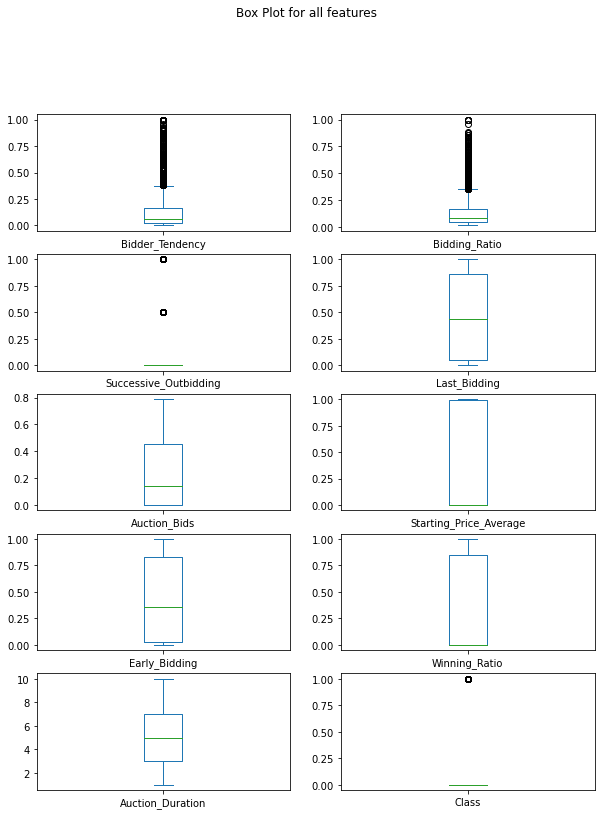

In [20]:
clean_df.plot(kind='box', subplots=True, layout=(6,2), sharex=False, sharey=False, figsize=(10,15), 
              title='Box Plot for all features')
plt.show()

**We can see that the features "Bidder_Tendency" and "Bidding_Ratio" have many outliers and features "Successive_Outbidding" and "Class" are unbalanced.**

**I will keep outliers as they represent natural variations in the population and contribute to the overall classification whether it's normal or abnormal bidding behaviour. I will also pass through algorithms without balancing the feature "class" and compare to results after balancing it.**  

"Natural variation can produce outliers which most of the time are not necessarily a problem. If the extreme value is a legitimate observation that is a natural part of the population you’re studying, you should leave it in the dataset." (Frost, 2019)  

Frost says in his 2019 article that "sometimes it's best to keep outliers in your data as they capture valuable information on the subject studied and that excluding extreme values solely due to their extremeness can distort the results by removing information about the variability and therefore forcing the subject area to appear less variable than it is in reality." (Frost, 2019)  

**In the case of the feature "Successive_Outbiding" it's a feature that contains one of the 3 values (0, 0.5, 1) being zero (0) the most common value in the feature. By looking at the Heatmap this is one of the most important features to predict our target variable "Class"**

### Visualizing Feature Density by Class

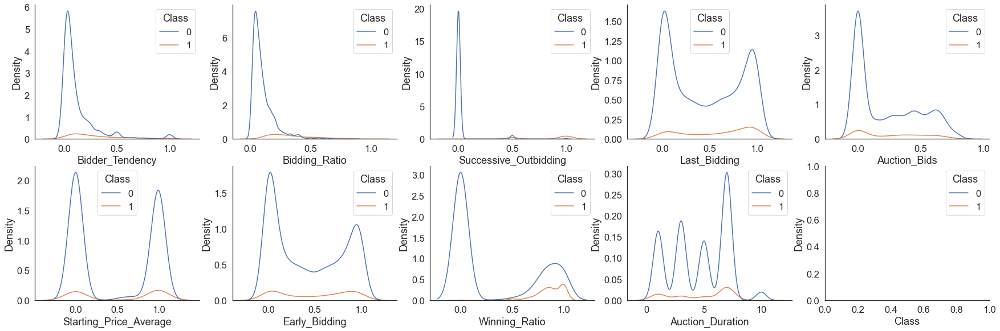

In [21]:
sns.set(style='white',font_scale=1.5)
fig = plt.figure(figsize=[30,20])
for i in range(10):
    fig.add_subplot(4, 5, i+1)
    sns.kdeplot(data=clean_df,x=clean_df.columns[i],hue='Class')
    if i == 10:
        plt.xlim([-50,300])
    sns.despine()
    plt.savefig('kdeplot.png',transparent=True, bbox_inches='tight')

**By looking at the kde plot above we can assume that normal bidding behaviour (Classified as 0 - blue line) happens mostly on values closer to 0 in most of the features.**

In [22]:
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6321 entries, 0 to 6320
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Bidder_Tendency         6321 non-null   float64
 1   Bidding_Ratio           6321 non-null   float64
 2   Successive_Outbidding   6321 non-null   float64
 3   Last_Bidding            6321 non-null   float64
 4   Auction_Bids            6321 non-null   float64
 5   Starting_Price_Average  6321 non-null   float64
 6   Early_Bidding           6321 non-null   float64
 7   Winning_Ratio           6321 non-null   float64
 8   Auction_Duration        6321 non-null   int64  
 9   Class                   6321 non-null   int64  
dtypes: float64(8), int64(2)
memory usage: 494.0 KB


**All features are either float or integer, therefore encoding will not be applied**

In [23]:
clean_df.head(10)

,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Last_Bidding,Auction_Bids,Starting_Price_Average,Early_Bidding,Winning_Ratio,Auction_Duration,Class
0,0.200000,0.400000,0.0,0.000028,0.000000,0.993593,0.000028,0.666667,5,0
1,0.024390,0.200000,0.0,0.013123,0.000000,0.993593,0.013123,0.944444,5,0
2,0.142857,0.200000,0.0,0.003042,0.000000,0.993593,0.003042,1.000000,5,0
3,0.100000,0.200000,0.0,0.097477,0.000000,0.993593,0.097477,1.000000,5,0
4,0.051282,0.222222,0.0,0.001318,0.000000,0.000000,0.001242,0.500000,7,0
5,0.038462,0.111111,0.0,0.016844,0.000000,0.000000,0.016844,0.800000,7,0
6,0.400000,0.222222,0.0,0.006781,0.000000,0.000000,0.006774,0.750000,7,0
7,0.137931,0.444444,1.0,0.768044,0.000000,0.000000,0.016311,1.000000,7,1
8,0.121951,0.185185,1.0,0.035021,0.333333,0.993528,0.023963,0.944444,7,1
9,0.155172,0.346154,0.5,0.570994,0.307692,0.993593,0.413788,0.611111,7,1


<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      3. Scaling / Normalizing the Data
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

**"It is important to scale the data as many machine learning algorithms learn by calculating the distance between the data points to make better inferences out of the data."**

**Reference:**  

Verma, Y. (2021). Why Data Scaling is important in Machine Learning & How to effectively do it. [online] Analytics India Magazine. Available at: https://analyticsindiamag.com/why-data-scaling-is-important-in-machine-learning-how-to-effectively-do-it/.

**As most of the features are within the range between 0 and 1 I will use MinMax scaler on "Auction_Duration" feature to bring the observations to the same scale as the rest of the dataset.**

**The MinMax scaling was chosen considering the feature does not contain outliers and it will bring the values to the same scale (between 0 and 1) as the other features.**

In [24]:
from sklearn.preprocessing import MinMaxScaler

In [25]:
scale_df = clean_df[['Auction_Duration']]
work_df = clean_df.drop(columns = ['Auction_Duration'])
min_max = MinMaxScaler().fit(scale_df)
min_max = min_max.transform(scale_df)
min_max

array([[0.44444444],
       [0.44444444],
       [0.44444444],
       ...,
       [0.66666667],
       [0.66666667],
       [0.66666667]])

In [26]:
scale_df = pd.DataFrame(min_max, columns = ['Auction_Duration'])
scale_df

,Auction_Duration
0,0.444444
1,0.444444
2,0.444444
3,0.444444
4,0.666667
...,...
6316,0.222222
6317,0.666667
6318,0.666667
6319,0.666667


In [27]:
work_df['Auction_Duration'] = scale_df['Auction_Duration']
work_df.head()

,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Last_Bidding,Auction_Bids,Starting_Price_Average,Early_Bidding,Winning_Ratio,Class,Auction_Duration
0,0.200000,0.400000,0.0,0.000028,0.0,0.993593,0.000028,0.666667,0,0.444444
1,0.024390,0.200000,0.0,0.013123,0.0,0.993593,0.013123,0.944444,0,0.444444
2,0.142857,0.200000,0.0,0.003042,0.0,0.993593,0.003042,1.000000,0,0.444444
3,0.100000,0.200000,0.0,0.097477,0.0,0.993593,0.097477,1.000000,0,0.444444
4,0.051282,0.222222,0.0,0.001318,0.0,0.000000,0.001242,0.500000,0,0.666667


<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      4. Feature Importance / Selection
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

**In order to map the feature importance I will use the Random Forest algorithm.**

I will employ feature selection in order to test the model with different dataframes when tuning hyperparameters.  

Random Forest is widely used for feature selection given it’s high accuracy, ability to generalize and for being easy to read and interpret. The model consists in multiple trees which will run through random extracted observations and features and “divide the dataset into 2 buckets, each of them hosting observations that are more similar among themselves and different from the ones in the other bucket. Not every tree sees all the features or all the observations, and this guarantees that the trees are de-correlated and therefore less prone to overfitting.” (Dubey, A. (2018). Feature Selection Using Random forest.)

**Split dataset in features and target variable.**

In [28]:
feature_cols = ["Bidder_Tendency","Bidding_Ratio","Successive_Outbidding", "Last_Bidding", "Auction_Bids",
                "Starting_Price_Average", "Early_Bidding", "Winning_Ratio", "Auction_Duration"] 
X = work_df[feature_cols]               # Features of the dataset
y = work_df.Class                       # Target variable of the dataset

# Display the X and y arrays
print(X, y)

      Bidder_Tendency  Bidding_Ratio  Successive_Outbidding  Last_Bidding  \
0            0.200000       0.400000                    0.0      0.000028   
1            0.024390       0.200000                    0.0      0.013123   
2            0.142857       0.200000                    0.0      0.003042   
3            0.100000       0.200000                    0.0      0.097477   
4            0.051282       0.222222                    0.0      0.001318   
...               ...            ...                    ...           ...   
6316         0.333333       0.160000                    1.0      0.738557   
6317         0.030612       0.130435                    0.0      0.005754   
6318         0.055556       0.043478                    0.0      0.015663   
6319         0.076923       0.086957                    0.0      0.068694   
6320         0.016393       0.043478                    0.0      0.340351   

      Auction_Bids  Starting_Price_Average  Early_Bidding  Winning_Ratio  \

**Split dataset into training set and test set.**  

80% training and 20% test

In [29]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold

In [30]:
 X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [31]:
clf_RF = RandomForestClassifier(n_estimators = 100)
clf_RF.fit(X_train ,y_train)

RandomForestClassifier()

In [32]:
df_impt = pd.DataFrame({'features':X_train.columns,'importance':clf_RF.feature_importances_})
df_impt = df_impt.sort_values(by='importance',ascending=True)
df_impt

,features,importance
5,Starting_Price_Average,0.008885
3,Last_Bidding,0.020753
6,Early_Bidding,0.020942
0,Bidder_Tendency,0.032596
4,Auction_Bids,0.039802
8,Auction_Duration,0.052324
7,Winning_Ratio,0.070347
1,Bidding_Ratio,0.154286
2,Successive_Outbidding,0.600065


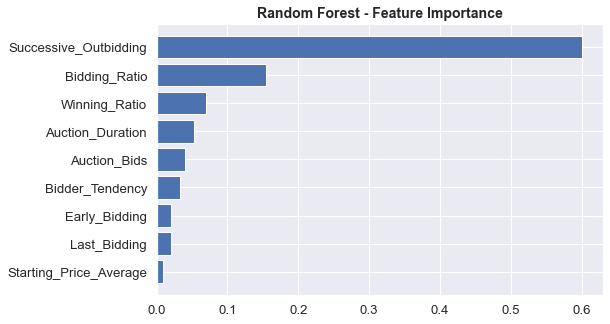

In [33]:
sns.set(style='darkgrid',font_scale=1.2)
fig = plt.figure(figsize=[8,5])
ax = plt.barh(df_impt['features'],df_impt['importance'])
plt.title('Random Forest - Feature Importance',weight='bold',fontsize=14)
plt.savefig('featureplot.png',transparent=True, bbox_inches='tight')
plt.show()

I will keep the ranking of feature importance to use later for tunning the models

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      5. First Round passing through the ML models
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

Before applying any other preprocessing techniques I will pass the data through the models in order to compare the results and select best models.

**ML models used:**  

    - Logistic Regression  
    - KNN  
    - Decision Tree  
    - SVM  

**I decided to employ classification models (supervised learning) using the Class feature as my target variable and the model to predict/classify whether a bidding is normal or anomalous**

"Supervised and unsupervised learning have one key difference. Supervised learning uses labeled datasets, whereas unsupervised learning uses unlabeled datasets. By “labeled” we mean that the data is already tagged with the right answer. A classification problem uses algorithms to classify data into particular segments." (www.alteryx.com, n.d.)

In [34]:
work_df.head()

,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Last_Bidding,Auction_Bids,Starting_Price_Average,Early_Bidding,Winning_Ratio,Class,Auction_Duration
0,0.200000,0.400000,0.0,0.000028,0.0,0.993593,0.000028,0.666667,0,0.444444
1,0.024390,0.200000,0.0,0.013123,0.0,0.993593,0.013123,0.944444,0,0.444444
2,0.142857,0.200000,0.0,0.003042,0.0,0.993593,0.003042,1.000000,0,0.444444
3,0.100000,0.200000,0.0,0.097477,0.0,0.993593,0.097477,1.000000,0,0.444444
4,0.051282,0.222222,0.0,0.001318,0.0,0.000000,0.001242,0.500000,0,0.666667


**I will store my dataframe into a new df to be able to compare results using different approaches.**

In [35]:
ML1_df = work_df.copy()

In [36]:
ML1_df.head()

,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Last_Bidding,Auction_Bids,Starting_Price_Average,Early_Bidding,Winning_Ratio,Class,Auction_Duration
0,0.200000,0.400000,0.0,0.000028,0.0,0.993593,0.000028,0.666667,0,0.444444
1,0.024390,0.200000,0.0,0.013123,0.0,0.993593,0.013123,0.944444,0,0.444444
2,0.142857,0.200000,0.0,0.003042,0.0,0.993593,0.003042,1.000000,0,0.444444
3,0.100000,0.200000,0.0,0.097477,0.0,0.993593,0.097477,1.000000,0,0.444444
4,0.051282,0.222222,0.0,0.001318,0.0,0.000000,0.001242,0.500000,0,0.666667


**Importing Libraries for ML models.**

In [37]:
from matplotlib import pyplot
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [38]:
models = []
models.append(('LR', LogisticRegression(solver='liblinear', multi_class='ovr')))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('SVM', SVC(gamma='auto')))

### Sampling the Data

In [39]:
feature_cols = ["Bidder_Tendency","Bidding_Ratio","Successive_Outbidding", "Last_Bidding", "Auction_Bids",
                "Starting_Price_Average", "Early_Bidding", "Winning_Ratio", "Auction_Duration"] 
X = ML1_df[feature_cols]               # Features of the dataset
y = ML1_df.Class                       # Target variable of the dataset

# Display the X and y arrays
print(X, y)

      Bidder_Tendency  Bidding_Ratio  Successive_Outbidding  Last_Bidding  \
0            0.200000       0.400000                    0.0      0.000028   
1            0.024390       0.200000                    0.0      0.013123   
2            0.142857       0.200000                    0.0      0.003042   
3            0.100000       0.200000                    0.0      0.097477   
4            0.051282       0.222222                    0.0      0.001318   
...               ...            ...                    ...           ...   
6316         0.333333       0.160000                    1.0      0.738557   
6317         0.030612       0.130435                    0.0      0.005754   
6318         0.055556       0.043478                    0.0      0.015663   
6319         0.076923       0.086957                    0.0      0.068694   
6320         0.016393       0.043478                    0.0      0.340351   

      Auction_Bids  Starting_Price_Average  Early_Bidding  Winning_Ratio  \

In [40]:
X_train, X_validation, y_train, y_validation = train_test_split(X, y, test_size=0.20, random_state=1)

In [41]:
results = []
names = []
for name, model in models:
	kfold = StratifiedKFold(n_splits=10, random_state=1, shuffle=True)
	cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
	results.append(cv_results)
	names.append(name)
	print('%s: %f (%f)' % (name, cv_results.mean(), cv_results.std()))

LR: 0.976468 (0.006389)
KNN: 0.988332 (0.004367)
CART: 0.997232 (0.002372)
SVM: 0.981216 (0.007910)


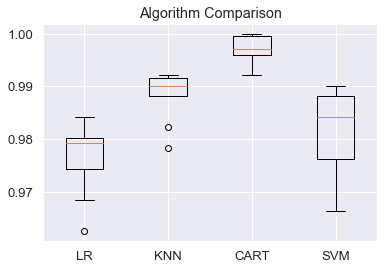

In [42]:
pyplot.boxplot(results, labels=names)
pyplot.title('Algorithm Comparison')
pyplot.show()

By looking at the accuracy average comparison between the models we can assume that the best model is Decision Tree followed by KNN.

However, the class feature is still unbalacend and therefore I will also look at other metrics in order to evaluate if the models are able to generalize the predictions or if I will need to balance the class feature.

I decided to select Decision Tree and KNN to proceed with further testing.

### Checking other metrics for KNN and Decision Tree

**KNN Metrics**

In [43]:
from sklearn import metrics

**Split dataset into training set and test set.**  

80% training and 20% test

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

In [45]:
kNN = KNeighborsClassifier(n_neighbors = 3)
kNN.fit(X_train, y_train)
y_pred = kNN.predict(X_test)

print( "Accuracy: {:.3f}".format(metrics.accuracy_score(y_test, y_pred)) )

Accuracy: 0.993


In [46]:
# Display upto 2 decimal places
print( "accuracy: {:.3f}".format(metrics.accuracy_score(y_test, y_pred)) )
print( "precision: {:.3f}".format(metrics.precision_score(y_test, y_pred)) )
print( "recall: {:.3f}".format(metrics.recall_score(y_test, y_pred)) )

accuracy: 0.993
precision: 0.950
recall: 0.985


In [47]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1131
           1       0.95      0.99      0.97       134

    accuracy                           0.99      1265
   macro avg       0.97      0.99      0.98      1265
weighted avg       0.99      0.99      0.99      1265



Text(28.5, 0.5, 'true')

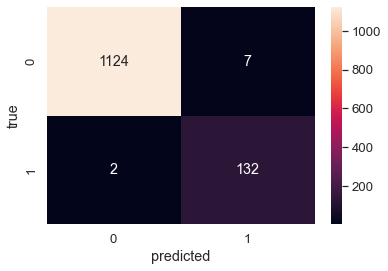

In [48]:
y_pred = kNN.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

From the confusion matrix it's observed that KNN predicts with high accuracy before balancing the feature class.

**Decision Tree Metrics**

In [49]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(max_depth = 2, random_state = 1)

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred2 = clf.predict(X_test)

In [51]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred2))

# Rounded upto 2 decimal places
print( "Accuracy: {:.3f}".format(metrics.accuracy_score(y_test, y_pred2)) )

Accuracy: 0.9778656126482214
Accuracy: 0.978


In [52]:
# Display upto 2 decimal places
print( "accuracy: {:.3f}".format(metrics.accuracy_score(y_test, y_pred2)) )
print( "precision: {:.3f}".format(metrics.precision_score(y_test, y_pred2)) )
print( "recall: {:.3f}".format(metrics.recall_score(y_test, y_pred2)) )

accuracy: 0.978
precision: 0.835
recall: 0.985


Text(28.5, 0.5, 'true')

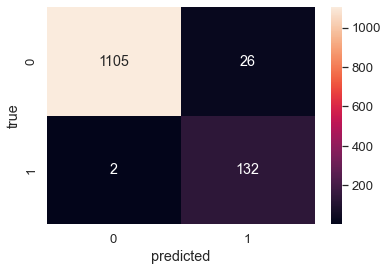

In [53]:
y_pred2 = clf.predict(X_test)
cm = confusion_matrix(y_test, y_pred2)

sns.heatmap(cm, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

From the confusion matrix it's observed that Decision Tree performs slightly worse than KNN but still predicts with high accuracy before balancing the feature class.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      6. Balancing the target variable - feature 'Class'
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

I will use the SMOTE (Synthetic Minority Oversampling Technique) to resample the feature "Class" and equalize the classes 0 and 1 creating synthetic data for the category that is under represented in the dataset, in this case the class 1.  

"A problem with imbalanced classification is that there are too few examples of the minority class for a model to effectively learn the decision boundary. SMOTE works by selecting examples that are close in the feature space, drawing a line between the examples in the feature space and drawing a new sample at a point along that line." (Brownlee, 2020)  

"… SMOTE first selects a minority class instance a at random and finds its k nearest minority class neighbors. The synthetic instance is then created by choosing one of the k nearest neighbors b at random and connecting a and b to form a line segment in the feature space. The synthetic instances are generated as a convex combination of the two chosen instances a and b." — Page 47, Imbalanced Learning: Foundations, Algorithms, and Applications, 2013.

In [54]:
#SMOTE
#Creating new random rows to equalise data
from collections import Counter
from imblearn.over_sampling import SMOTE # doctest: +NORMALIZE_WHITESPACE

print('Original dataset shape %s' % Counter(y))

Original dataset shape Counter({0: 5646, 1: 675})


In [56]:
#Original dataset shape Counter({0: 5646, 1: 675})
sm = SMOTE(random_state = 42)
X_res, y_res = sm.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_res))

Resampled dataset shape Counter({0: 5646, 1: 5646})


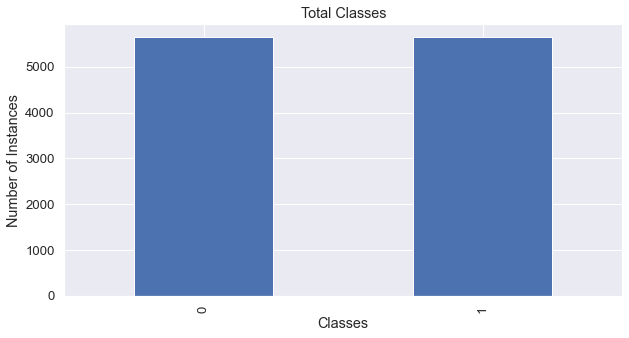

In [57]:
y_res.value_counts().nlargest(40).plot(kind="bar", figsize=(10,5))
plt.title("Total Classes")
plt.ylabel("Number of Instances")
plt.xlabel("Classes");

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      7. Second Round passing through the ML models
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

**I will pass the data through the selected models after balancing the target variable and compare the results.**

Storing the resampled data into the main variables.

In [58]:
X = X_res               # Features of the dataset
y = y_res               # Target variable of the dataset

**Split dataset into training set and test set.**  

80% training and 20% test

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

### KNN (k-nearest neighbour)

**In the 1st round KNN was tested and identified as one of the models performing with highest accuracy and therefore was selected as one of the models to predict anomalous bidding behaviour from our dataset.**  

"k-nearest neighbors (kNN) is a supervised machine learning algorithm that can be used for both Regression and Classification. The algorithm calculates the Euclidean distance between the data points and predict the correct class for the test data values." (C. Muller and Guido, 2016)

In [60]:
kNN = KNeighborsClassifier(n_neighbors = 3)
kNN.fit(X_train, y_train)
y_pred = kNN.predict(X_test)

print( "Accuracy: {:.3f}".format(metrics.accuracy_score(y_test, y_pred)) )

Accuracy: 0.996


In [61]:
# Display upto 2 decimal places
print( "accuracy: {:.3f}".format(metrics.accuracy_score(y_test, y_pred)) )
print( "precision: {:.3f}".format(metrics.precision_score(y_test, y_pred)) )
print( "recall: {:.3f}".format(metrics.recall_score(y_test, y_pred)) )

accuracy: 0.996
precision: 0.991
recall: 1.000


In [62]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1136
           1       0.99      1.00      1.00      1123

    accuracy                           1.00      2259
   macro avg       1.00      1.00      1.00      2259
weighted avg       1.00      1.00      1.00      2259



Text(28.5, 0.5, 'true')

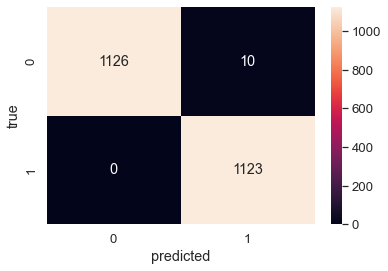

In [63]:
y_pred = kNN.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

We can note that accuracy metrics improved after equalizing the target variable using KNN.

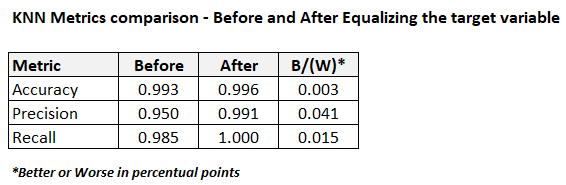

### Decision Tree

Decision Trees work by classifying categories by order of lower gini. A gini index of 0 represents perfect equality while a gini of 100 implies perfect inequality.

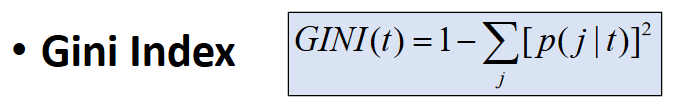

In [64]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(max_depth = 2, random_state = 1)

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred2 = clf.predict(X_test)

In [65]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred2))

# Rounded upto 2 decimal places
print( "Accuracy: {:.3f}".format(metrics.accuracy_score(y_test, y_pred2)) )

Accuracy: 0.9902611775121736
Accuracy: 0.990


In [66]:
# Display upto 2 decimal places
print( "accuracy: {:.3f}".format(metrics.accuracy_score(y_test, y_pred2)) )
print( "precision: {:.3f}".format(metrics.precision_score(y_test, y_pred2)) )
print( "recall: {:.3f}".format(metrics.recall_score(y_test, y_pred2)) )

accuracy: 0.990
precision: 0.983
recall: 0.997


Text(28.5, 0.5, 'true')

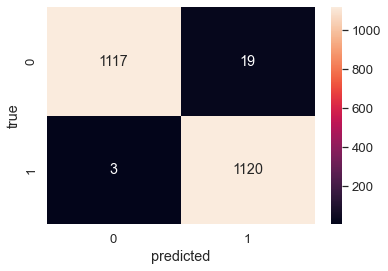

In [67]:
y_pred2 = clf.predict(X_test)
cm = confusion_matrix(y_test, y_pred2)

sns.heatmap(cm, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

Decision Tree model also improved after equalizing the target variable.

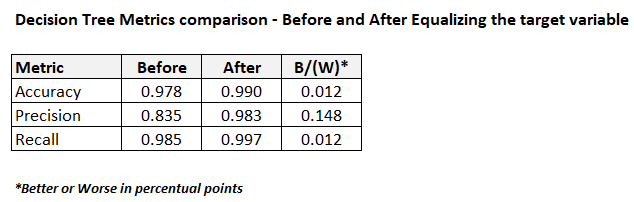

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      8. Applying PCA
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

"PCA or Principal Component Analysis is a fast and flexible unsupervised method for dimensionality
reduction in data, and it can also be used for visualization, noise filtering, feature extraction and engineering, and much more." Vanderplas, J.T. (2017)  

As we previouly saw the ML models worked very well on the dataset and therefore dimensionality reduction wouldn't be needed in this case to improve the model's accuracy. However, I will employ dimensionality reduction techniques in order to visualize the classes in a reduced dimensional space.

I will now apply PCA to my dataset after data preparation and visualize the data points in a reduced dimensional space.

In [68]:
from sklearn.decomposition import PCA

"A vital part of using PCA in practice is the ability to estimate how many components are
needed to describe the data. This can be determined by looking at the cumulative explained
variance ratio as a function of the number of components:" Vanderplas, J.T. (2017)

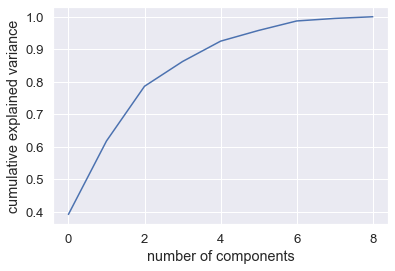

In [69]:
pca_df = work_df.drop(['Class'], axis=1)
pca = PCA().fit(pca_df) 
plt.plot(np.cumsum(pca.explained_variance_ratio_)) 
plt.xlabel('number of components') 
plt.ylabel('cumulative explained variance');

**As seen from the above chart (Cumulative explained variance ratio), in order to keep most of the data explained variance, 6 is the optimal number of features to keep.**

In [70]:
pca = PCA(6)
projected = pca.fit_transform(pca_df)

In [71]:
projected.shape

(6321, 6)

In [72]:
print(pca.explained_variance_ratio_)

[0.39157562 0.22591338 0.16852933 0.07621176 0.06264657 0.03300072]


**By applying 6 features to the pca transform I am able to keep 95.8% of the variance in the data.**

In [73]:
pca_df = pd.DataFrame(projected, columns=["C1","C2","C3", "C4", "C5", "C6"])

In [74]:
pca_df.head()

,C1,C2,C3,C4,C5,C6
0,-0.269290,-0.272691,0.729656,-0.044915,-0.298888,-0.060605
1,-0.334317,-0.126619,0.807153,-0.067090,-0.487222,-0.170473
2,-0.361872,-0.087766,0.857223,-0.064703,-0.477186,-0.067269
3,-0.275823,-0.007718,0.793840,-0.067597,-0.494572,-0.103589
4,-0.810817,-0.206667,-0.045012,0.259981,-0.107263,-0.059759


In [75]:
pca_df["Class"] = work_df["Class"]

**This is what it looks like the new dataframe after applying PCA**

In [76]:
pca_df.head()

,C1,C2,C3,C4,C5,C6,Class
0,-0.269290,-0.272691,0.729656,-0.044915,-0.298888,-0.060605,0
1,-0.334317,-0.126619,0.807153,-0.067090,-0.487222,-0.170473,0
2,-0.361872,-0.087766,0.857223,-0.064703,-0.477186,-0.067269,0
3,-0.275823,-0.007718,0.793840,-0.067597,-0.494572,-0.103589,0
4,-0.810817,-0.206667,-0.045012,0.259981,-0.107263,-0.059759,0


### Visualizing Data after PCA

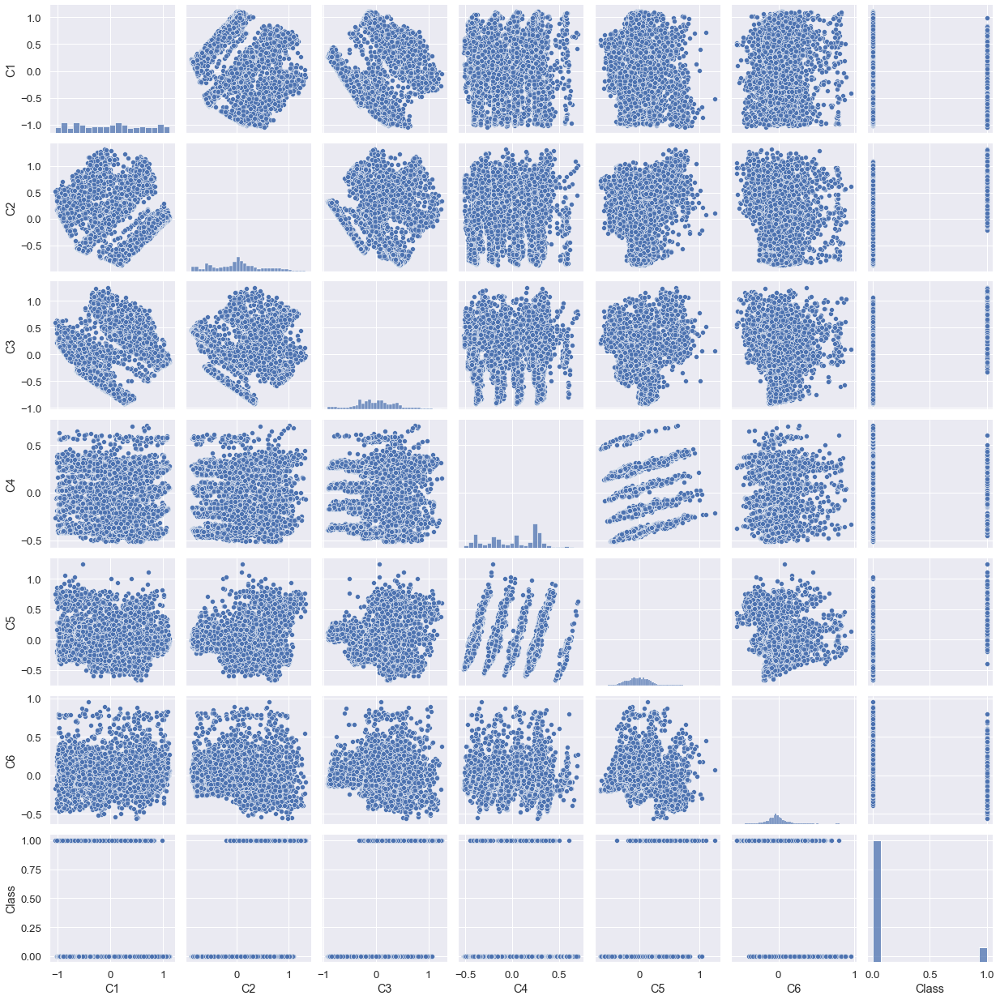

In [77]:
sns.pairplot(pca_df)

By looking at the pairplot after PCA it is hard to distinguishe classes between datapoints and features C4 and C5 seems to have the highest correlation. A Linear model such as Logistic Regression could also be applied after PCA for our classification purposes.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      9. Applying LDA
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

"Linear discriminant analysis is used as a tool for classification, dimension reduction, and data
visualization. It has been around for quite some time now. Despite its simplicity, LDA often produces
robust, decent, and interpretable classification results. When tackling real-world classification
problems, LDA is often the first and benchmarking method before other more complicated and
flexible ones are employed." (Xiaozhou, 2020)  

Xiaozhou, Y. (2020). Linear Discriminant Analysis, Explained. [online] Medium. Available at: https://towardsdatascience.com/linear-discriminant-analysis-explained-f88be6c1e00b.

As we previouly saw the ML models worked very well on the dataset and therefore dimensionality reduction wounldn't be needed in this case to improve the model's accuracy. However, I will employ dimensionality reduction techniques in order to visualize the classes in a reduced dimensional space.

I will now apply LDA to my dataset after data preparation and visualize the data points in a reduced dimensional space.

In [78]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [79]:
lda_df = work_df.copy()

In [80]:
lda_df.head()

,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Last_Bidding,Auction_Bids,Starting_Price_Average,Early_Bidding,Winning_Ratio,Class,Auction_Duration
0,0.200000,0.400000,0.0,0.000028,0.0,0.993593,0.000028,0.666667,0,0.444444
1,0.024390,0.200000,0.0,0.013123,0.0,0.993593,0.013123,0.944444,0,0.444444
2,0.142857,0.200000,0.0,0.003042,0.0,0.993593,0.003042,1.000000,0,0.444444
3,0.100000,0.200000,0.0,0.097477,0.0,0.993593,0.097477,1.000000,0,0.444444
4,0.051282,0.222222,0.0,0.001318,0.0,0.000000,0.001242,0.500000,0,0.666667


In [81]:
feature_cols = ["Bidder_Tendency","Bidding_Ratio","Successive_Outbidding", "Last_Bidding", "Auction_Bids",
                "Starting_Price_Average", "Early_Bidding", "Winning_Ratio", "Auction_Duration"] 
X = lda_df[feature_cols]               # Features of the dataset
y = lda_df.Class                       # Target variable of the dataset

In [82]:
lda = LinearDiscriminantAnalysis()
X_lda = lda.fit_transform(X,y)

In [83]:
lda.explained_variance_ratio_

array([1.])

**The explained variance ratio tells me one column/axis will be created compiling the data after LDA transform.**

In [84]:
lda_df = pd.DataFrame(X_lda, columns=["LDA1"])

In [85]:
lda_df.head()

,LDA1
0,-0.717181
1,-0.647310
2,-0.617970
3,-0.614382
4,-0.821493


In [86]:
lda_df["Class"] = work_df["Class"]

**Creating the new dataframe after applying Linear Discriminant Analysis**

In [87]:
lda_df.head(10)

,LDA1,Class
0,-0.717181,0
1,-0.647310,0
2,-0.617970,0
3,-0.614382,0
4,-0.821493,0
5,-0.722898,0
6,-0.701716,0
7,7.606464,1
8,7.420232,1
9,3.373812,1


### Visualizing Data after LDA

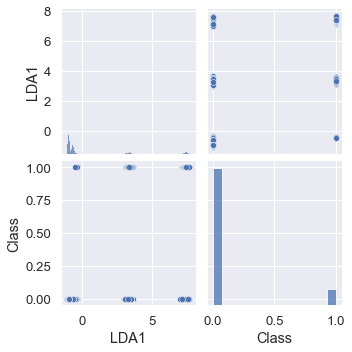

In [88]:
sns.pairplot(lda_df)

LDA created only one feature/dimension, it is noted that 3 different categories were grouped around the two different classes.

[Text(0.5, 0, 'Distribution'),
 Text(0, 0.5, 'LDA Variable'),
 Text(0.5, 1.0, 'LDA Variable Distribution')]

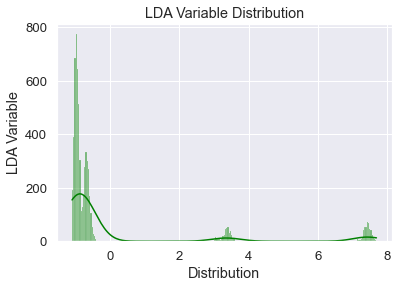

In [89]:
ax = sns.histplot(lda_df.LDA1, kde=True, color ='green')
ax.set(xlabel='Distribution', ylabel='LDA Variable', title ='LDA Variable Distribution')

We can see that most of the instances will be grouped in the negative side of the table which represents the class 0 or normal bidding behaviour because for LDA the target variable was not balanced. I will then balance the target variable and visualize the distribution again.

### Balancing the target variable using the SMOTE technique

In [90]:
X3 = lda_df.LDA1               # Features of the dataset
y3 = lda_df.Class               # Target variable of the dataset

In [91]:
print('Original dataset shape %s' % Counter(y3))

Original dataset shape Counter({0: 5646, 1: 675})


**I tried to rebalance the target variable after LDA but I'm getting the following error which I haven't been able to solve just yet**  

ValueError: Expected 2D array, got 1D array instead:
array=[-0.71718075 -0.64730973 -0.61796987 ... -0.95984637 -0.93768671
 -0.93800588].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

I will keep this in my next steps list, to look at this idea and see what other insights we can take from balancing the target variable for applying LDA.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      10. Dimensionality Reduction - Differences between PCA and LDA - Explained
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

    The simplest and most popular techniques used for dimensionality reduction are - Principal Component Analysis (PCA) and Linear Discriminant Analysis (LDA). Both methods are used to reduce the number of features in a dataset while retaining as much information as possible. (Kumar, 2022)  
    
    PCA is an unsupervised learning algorithm meaning that it will work without a class or labels, while LDA is a supervised learning and therefore will work towards class separability. PCA finds directions of maximum variance regardless of class or labels while LDA finds directions of maximum class separability. (Kumar, 2022)
    
    In general when we're trying to solve a classification problem LDA for dimensionality reduction would suit better as it works on finding directions of maximum class separability based on labels / target variables. LDA will also be of great use on high dimensional datasets with no labels when most part of this dataset would be only noise, for instance if the dataset contains 100 columns but only 10 of those are important for the purpose, LDA will identify those 10 components capturing class separability and discarding noisy features. On the other hand PCA will be of great use when dealing with high dimensional datasets where there's no labels and all features are important and should be captured retaining as much information as possible to help visualize and understand the spread of data in a smaller dimensional space.
    
    "So the best technique will depend on what kind of data we're working with and the goals. If we're working with labeled data and our goal is to find a low-dimensional representation that maximizes class separability, then LDA will probably be the best approach. However, if your goal is simply to find a low-dimensional representation that retains as much information as possible or if you’re working with unlabeled data, then PCA might be a better choice." (Kumar, 2022)

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      11. Models Hyperparameter tuning
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

"Machine learning models are not intelligent enough to know what hyperparameters would lead to the highest possible accuracy on the given dataset. However, hyperparameter values when set right can build highly accurate models, and thus we allow our models to try different combinations of hyperparameters during the training process and make predictions with the best combination of hyperparameter values." (Jamal, 2021)  

Jamal, T. (2021). Hyperparameter tuning in Python. [online] Medium. Available at: https://towardsdatascience.com/hyperparameter-tuning-in-python-21a76794a1f7 [Accessed 22 Dec. 2022].

**ML models used:**  

    - KNN  
    - Decision Tree  

### Hyperparameter tunning for KNN

#### Finding optimal k value

In [92]:
neighbors = np.arange(1, 11)                  # number of neighbors
train_accuracy = np.zeros(len(neighbors))     # Declare and initialise the matrix
test_accuracy = np.zeros(len(neighbors))      # Declare and initialise the matrix

In [93]:
for i, k in enumerate(neighbors):                          # for loop that checks the model for neighbor values 1, 2, 3, ..., 10
    kNN2 = KNeighborsClassifier(n_neighbors = k)            # Initialise an object knn using KNeighborsClassifier method

    # Fit the model
    kNN2.fit(X_train, y_train)                              # Call fit method to implement the ML KNeighborsClassifier model

    # Compute accuracy on the training set
    train_accuracy[i] = kNN2.score(X_train, y_train)        # Save the score value in the train_accuracy array

    # Compute accuracy on the test set
    test_accuracy[i] = kNN2.score(X_test, y_test)           # Save the score value in the train_accuracy array

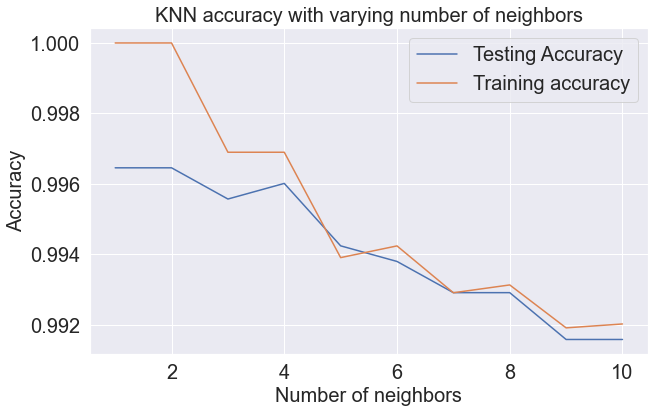

In [94]:
import matplotlib.pyplot as plt

plt.figure(figsize = (10, 6))
plt.title('KNN accuracy with varying number of neighbors', fontsize = 20)
plt.plot(neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training accuracy')
plt.legend(prop={'size': 20})
plt.xlabel('Number of neighbors', fontsize = 20)
plt.ylabel('Accuracy', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

Accuracy decreases as the number of k neighbours increases, however the accuracy between Testing and Training set gets closer to each other varying as the number of k neighbours increases. The variance is not significant and therefore I have decided to use 4 k neighbours in my model as that is the point where accuracy still high while decreasing the gap between Training and Testing.

In [95]:
kNN2 = KNeighborsClassifier(n_neighbors = 4)
kNN2.fit(X_train, y_train)
y_pred = kNN2.predict(X_test)

print( "accuracy: {:.3f}".format(metrics.accuracy_score(y_test, y_pred)) )
print( "precision: {:.3f}".format(metrics.precision_score(y_test, y_pred)) )
print( "recall: {:.3f}".format(metrics.recall_score(y_test, y_pred)) )

accuracy: 0.996
precision: 0.992
recall: 1.000


Text(28.5, 0.5, 'true')

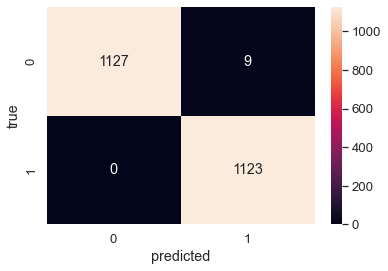

In [96]:
y_pred = kNN2.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

**KNN model has achieved a significant high accuracy in terms of predicting the correct values after data preparation and hyperparameters tunning.**

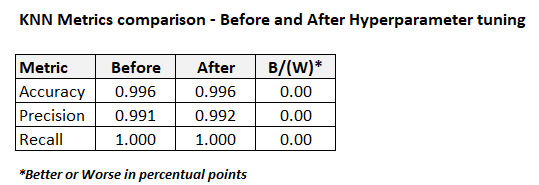

### Hyperparameters tunning for Decision Tree

In order to find the optimal hyperparameters for Decision Tree I will employ the CV Grid Search technique.  

"In the grid search algorithm, each square in a grid has a combination of hyperparameters and the model has to train itself on each combination. Scikit-learn library in Python provides us with an easy way to implement grid search in just a few lines of code." (Jamal, 2021)

In [97]:
from sklearn.model_selection import GridSearchCV

In [98]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'criterion':['gini','entropy'],
    'max_depth': range(1,10),
    'min_samples_leaf': range(1,10),
    'min_samples_split': range(1,10),
}
# Create a based model
clf = DecisionTreeClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(clf, param_grid=param_grid, cv=10, verbose=1, n_jobs=-1)
grid_search.fit(X_train,y_train)

Fitting 10 folds for each of 1458 candidates, totalling 14580 fits


GridSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(1, 10),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(1, 10)},
             verbose=1)

**Below are the best parameters found by CV Grid Search.**

In [99]:
grid_search.best_params_

{'criterion': 'gini',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'min_samples_split': 3}

In [100]:
grid_search.best_estimator_

DecisionTreeClassifier(max_depth=9, min_samples_split=3)

In [101]:
grid_search.best_score_

0.9990035672634974

#### Applying best hyperparameters to the model

In [102]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion = 'gini', max_depth = 9, 
                             min_samples_leaf = 1, min_samples_split = 3, random_state = 1)

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred2 = clf.predict(X_test)

In [103]:
# Display upto 2 decimal places
print( "accuracy: {:.3f}".format(metrics.accuracy_score(y_test, y_pred2)) )
print( "precision: {:.3f}".format(metrics.precision_score(y_test, y_pred2)) )
print( "recall: {:.3f}".format(metrics.recall_score(y_test, y_pred2)) )

accuracy: 0.998
precision: 0.997
recall: 0.999


Text(28.5, 0.5, 'true')

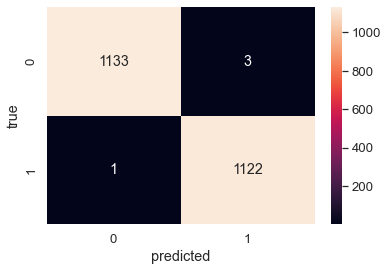

In [104]:
y_pred2 = clf.predict(X_test)
cm = confusion_matrix(y_test, y_pred2)

sns.heatmap(cm, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

**Decision Tree model has achieved a significant high accuracy in terms of predicting the correct values after data preparation and hyperparameters tunning.**

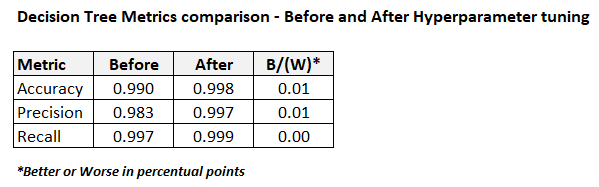

#### Comparing both models

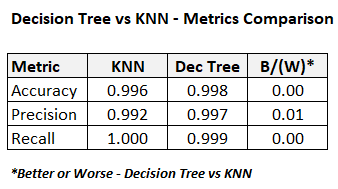

We can see that both models performed similarly in terms of accuracy, however looking at the confusion matrix we can see that Decision Tree has better capability for classifying / predicting the target variable slightly better than KNN.

I ended up not applying feature selection as the models performed very well within the current dataframe format.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      12. Findings and Conclusions
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

The main goals outlined in the beginning of the report were successfully achieved and implemented:
        
   **1. Format and prepare the data for machine learning:**
    
Data was analyzed through EDA, cleaned and prepared for the 1st Round of Machine Learning implementation. In the first round the dataset had it's target variable 'Class' unbalanced with majority of classes being '0' which represents normal bidding behaviour. An average accuracy of 4 different models were tested and the best two were selected to further development, KNN and Decision Tree.  

It was observed that the models accuracy metrics performed better after balancing the target variable 'Class' and even better when tuning the hyperparameters.
        
        
   **2. Explore the possibility of using dimensional reduction on the dataset, and explain the differences between the employed techniques:**  
   
For Dimensionality reduction, both PCA and LDA were employed plotting visualizations and explaining the difference between both techniques.  

As my goal and intention is to develop a model to classify / predict based on a target variable, as a next step LDA would be further explored and used to boost the models.  

PCA was employed in order to visualize data in a lower dimensional space. By looking at the pairplot it's noted that features C4 and C5 seems to have the highest correlation. A Linear model such as Logistic Regression could also be applied after PCA for our classification purposes.
        
        
   **3. Achieve high levels of accuracy for classification/prediction of anomalous bidding behaviour and explain the choice of machine learning models**  
   
KNN (k-nearest neighbours classifier) and Decision Tree classifier were selected for implementation and performed very well in the three iterations but had it's best performance after tuning the hyperparameters. Decision Tree performed slightly better on predicting the correct values in the test set achieving accuracy of 99.8% vs 99.6% for KNN.  

KNN and Decision Tree were both selected for classifying normal vs anomalous bidding behaviour from the "Shill Bidding dataset" as they presented the highest average accuracy on the first test and they are also both strong models for classification and simple to implement.  
        
        
   **4. Apply hyperparameters tunning and compare metrics**
        
For KNN a loop function was created to check and find the optimal number of neighbours to be set in the algorithm and it has slightly improved accuracy when compared to prior iterations.  

For Decision Tree hyperparameters tunning the Grid Search CV technique was employed to find the best parameters combination to train the algorithm and it has significantly improved accuracy metrics when compared to prior iterations and Decision Tree was selected as the best model to be implemented for the purpose of classifying normal vs anomalous bidding behaviour from the "Shill Bidding dataset".

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      13. Bibliography
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

### Reference list

**Brownlee, J. (2020).** SMOTE for Imbalanced Classification with Python. [online] Machine Learning Mastery. Available at: https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/.

**C. Muller, A. and Guido, S. (2016).** Introduction To Machine Learning With Python. Oreilly & Associates Inc.

**Haibo He, Ma, Y. and Wiley, J. (2013).** Imbalanced learning : foundations, algorithms, and applications. Hoboken: John Wiley & Sons, Cop.

**Jamal, T. (2021).** Hyperparameter tuning in Python. [online] Medium. Available at: https://towardsdatascience.com/hyperparameter-tuning-in-python-21a76794a1f7 [Accessed 22 Dec. 2022].

**Kumar, A. (2020).** Python - Replace Missing Values with Mean, Median & Mode. [online] Data Analytics. Available at: https://vitalflux.com/pandas-impute-missing-values-mean-median-mode/.

**Kumar, A. (2022).** PCA vs LDA Differences, Plots, Examples. [online] Data Analytics. Available at: https://vitalflux.com/pca-vs-lda-differences-plots-examples/ [Accessed 23 Dec. 2022].

**Vanderplas, J.T. (2017).** Python data science handbook : essential tools for working with data. Beijing Etc.: O’reilly, Cop.

**Verma, Y. (2021).** Why Data Scaling is important in Machine Learning & How to effectively do it. [online] Analytics India Magazine. Available at: https://analyticsindiamag.com/why-data-scaling-is-important-in-machine-learning-how-to-effectively-do-it/.

www.alteryx.com. (n.d.). Supervised vs. Unsupervised Learning; Which Is Best? | Alteryx. [online] Available at: https://www.alteryx.com/glossary/supervised-vs-unsupervised-learning.

**Xiaozhou, Y. (2020).** Linear Discriminant Analysis, Explained. [online] Medium. Available at: https://towardsdatascience.com/linear-discriminant-analysis-explained-f88be6c1e00b.

**Frost, J. (2019).** Guidelines for Removing and Handling Outliers in Data - Statistics by Jim. [online] Statistics by Jim. Available at: https://statisticsbyjim.com/basics/remove-outliers/ [Accessed 28 Dec. 2022].